# Using NYC Airbnb data to plan my New York city trip

My brother recently moved to New York city to pursue his graduate studies. I live in London and have never visited New York. So I thought- what would be a better time than now to go visit my brother. 

But I know travelling across continents can be expensive. It doesn't help that New York city has also been [ranked][] as the second most expensive city for 2022. 

[ranked]:https://edition.cnn.com/travel/article/world-most-expensive-cities-2022-intl-hnk/index.html 


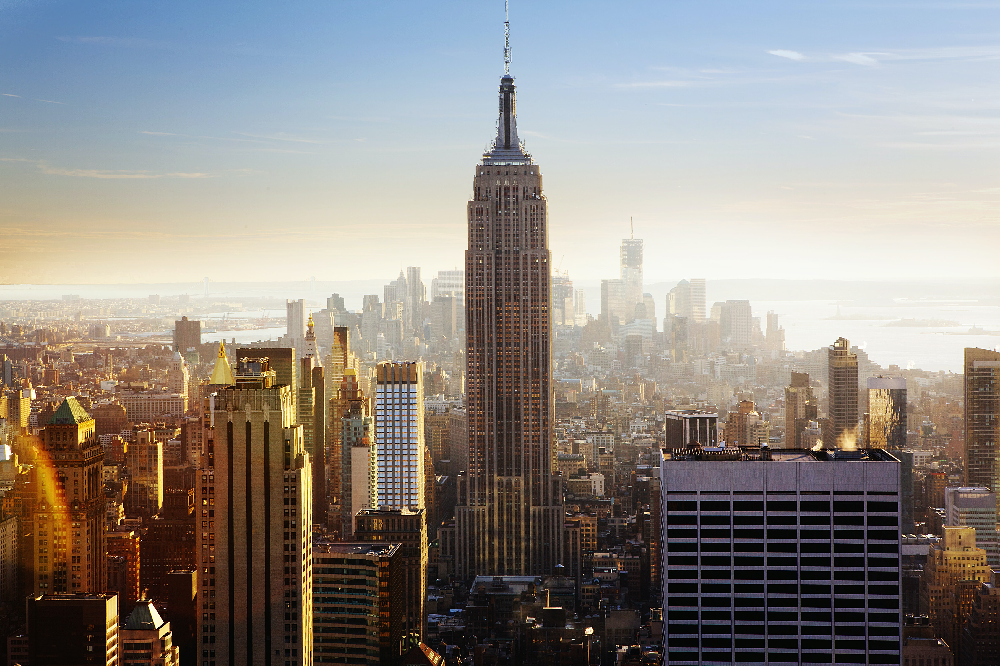

So, I started looking around how best to make my trip affordable. One of the most important items when planning for a trip is to decide on where to stay. [Airbnb][] has become an important platform to find accommodation while travelling. The company also makes a lot of its data available for free. Through the [Inside Airbnb][] website, anyone can have access to a great amount of information about Airbnb operation in the most important cities in the world, including New York city. Now they provide some helpful insights form the data already. But I was keen to understand how I can use this data to plan my New York city trip effectively.


[Airbnb]:https://www.airbnb.com/new-york-ny/stays
[Inside Airbnb]:http://insideairbnb.com/new-york-city

## What questions did I want answers to?

Like any traveller, I had a lot of things to consider when it came around to choosing an accommodation for my travels. Price is definitely one of the key factors. But there are others such as the location of the accommodation and for me in parituclar, the cleanliness of the accommodation. 

1. Which neighbourhoods have the most listings in NYC?   
2. How do prices of listings vary by neighbourhood?  
3. Is living near tourist attractions going to cost me lot?  
4. Should I choose to go with a listing where the host is a superhost?  
5. Does it matter what time of the year, month or week I decide to visit NYC when it comes to accommodation prices?  

To answer the above questions, I decided to work on a data science project. To get to the answers, we'll need to go through the following steps:

1. Getting and exploring the data  
2. Cleaning the data  
3. Analyzing the data  

I use Python and its powerful libraries to get this job done!

## The Airbnb data that I used

We'll begin by importing some libraries:    

* `numpy` and `pandas` for data manipulation  
* `seaborn` and `matplotlib` for data visualization
* `folium` to deal with geographical data
* `geopandas` to deal with geographical data

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import geopandas as gpd

In [3]:
import warnings # to avoid warning messages
warnings.filterwarnings("ignore")

## Getting the data

In [6]:
listings_data = pd.read_csv('listings.csv.gz', compression='gzip', error_bad_lines=False)
calendar_data = pd.read_csv('calendar.csv.gz', compression='gzip', error_bad_lines=False)

## Exploring the data

I start off by exploring the listings dataset to see what how big it is, what variables it contains and what data types these variables are stored as

In [7]:
listings_data.head() #list the top rows of the dataset

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,2539,https://www.airbnb.com/rooms/2539,20220907064715,2022-09-07,city scrape,Clean & quiet apt home by the park,Renovated apt home in elevator building.<br />...,Close to Prospect Park and Historic Ditmas Park,https://a0.muscache.com/pictures/3949d073-a02e...,2787,...,5.00,4.75,4.88,NaN,f,9,1,6,2,0.11
1,2595,https://www.airbnb.com/rooms/2595,20220907064715,2022-09-07,city scrape,Skylit Midtown Castle,"Beautiful, spacious skylit studio in the heart...",Centrally located in the heart of Manhattan ju...,https://a0.muscache.com/pictures/f0813a11-40b2...,2845,...,4.80,4.81,4.40,NaN,f,3,3,0,0,0.31
2,5121,https://www.airbnb.com/rooms/5121,20220907064715,2022-09-07,city scrape,BlissArtsSpace!,One room available for rent in a 2 bedroom apt...,NaN,https://a0.muscache.com/pictures/2090980c-b68e...,7356,...,4.91,4.47,4.52,NaN,f,2,0,2,0,0.31
3,45910,https://www.airbnb.com/rooms/45910,20220907064715,2022-09-07,city scrape,Beautiful Queens Brownstone! - 5BR,"<b>The space</b><br />Beautiful, fully furnish...",NaN,https://a0.muscache.com/pictures/27117627/19ff...,204539,...,5.00,4.82,4.55,NaN,f,6,6,0,0,0.10
4,5136,https://www.airbnb.com/rooms/5136,20220907064715,2022-09-07,city scrape,"Spacious Brooklyn Duplex, Patio + Garden",We welcome you to stay in our lovely 2 br dupl...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,7378,...,5.00,4.67,5.00,NaN,f,1,1,0,0,0.03


In [8]:
print(listings_data.shape) #describes the shape of the data i.e. number of rows and columns

listings_data.info() #describes the dataset through column names, number of non-null values in each and data type

(39881, 75)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39881 entries, 0 to 39880
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            39881 non-null  int64  
 1   listing_url                                   39881 non-null  object 
 2   scrape_id                                     39881 non-null  int64  
 3   last_scraped                                  39881 non-null  object 
 4   source                                        39881 non-null  object 
 5   name                                          39868 non-null  object 
 6   description                                   39036 non-null  object 
 7   neighborhood_overview                         23466 non-null  object 
 8   picture_url                                   39881 non-null  object 
 9   host_id                                       398

We see that the dataset has 39,881 rows and 75 columns.  
Since there is a possibility that listings might be duplicated, we would want to drop any duplicate rows

In [9]:
listings_data.drop_duplicates()

listings_data.shape

(39881, 75)

The dataset has no duplicates. There are 39880 listings in our data with 75 features for each listing.

### Exploring missing data

#### Datatsets usually don't come in the exact form in which we would like to work on them. One of the challenges with most (if not all) datasets is missing data. We need to deal with missing data.   

#### The first step in handling missing values is to look at the data carefully and find out all the missing values.

From looking at the different columns of the data, we see that there are some columns which have null values. Let's explore these as null data is usally not helpful for analysis. 
We will investogate which null values we should be worried about and then decide what we want to do about it.

In [10]:
pd.options.display.max_rows = 400 #increases the viewing pane of my dataset

# Shows me the list of features  with proportion of  null values sorted in descending order.
(listings_data.isnull().sum()/listings_data.shape[0]*100).sort_values(ascending = False) 

bathrooms                                       100.000000
calendar_updated                                100.000000
license                                          99.987463
host_about                                       43.559590
neighborhood_overview                            41.159951
neighbourhood                                    41.157443
host_response_time                               33.971064
host_response_rate                               33.971064
host_acceptance_rate                             29.740979
review_scores_value                              22.145884
review_scores_location                           22.145884
review_scores_checkin                            22.138362
review_scores_accuracy                           22.128332
review_scores_communication                      22.115794
review_scores_cleanliness                        22.103257
reviews_per_month                                20.967378
first_review                                     20.9673

**Takeaways:**

1. Three features (columns) have complete null values . I would have liked to have an idea of bathrooms in listings but there is another variable - bathrooms text which I might be able to use.
2. The other features with significant proportion of null values are - License, host_about, beighbourhood overview and neighbourhood.
3. I would be keen to use neighbourhood in my analysis and I see that there is another variable neighbourhood_cleansed which has no null values so I can potentially use this for my analysis

Given the questions I am interested in and looking at alternative features available within the data which look more complete, I decide to create a subset of my original data which removes the features with significant missing values.

I then look at the remaining columns and pick the ones which will be required for my analysis. This reduces the size of the dataset and improves processing speed.

In [11]:
#Drop the following columns from the datase
ny_listings = listings_data.drop(columns =["bathrooms", "calendar_updated","license"], axis = 1)
ny_listings = ny_listings.drop(columns = ["host_about", "neighborhood_overview", "neighbourhood"], axis =1)

In [12]:
#Create the dataset from the remaining features that are important for my analysis
ny_listings_df = ny_listings[["id",
                             "has_availability",
                             "number_of_reviews",
                             "property_type",
                             "room_type",
                             "accommodates",
                             "neighbourhood_group_cleansed",
                             "neighbourhood_cleansed",
                             "latitude",
                             "longitude",
                             "price",
                             "host_is_superhost",
                             "host_identity_verified",
                             "review_scores_value", 
                             "review_scores_location",
                             "review_scores_checkin",
                             "review_scores_cleanliness",
                             "review_scores_accuracy",
                             "bathrooms_text",
                              "beds",
                              "bedrooms"
]]

##  Q1. Which neighbourhoods have the most listings in NYC?

I start off by looking at the different neighbourhood groups that the listings fall under.  
I then plot them on a chart to see how the listings are distributed across those neighboruhood groups.

In [13]:
ny_nbd_groups_levels = ny_listings_df["neighbourhood_group_cleansed"].unique()
ny_nbd_groups_levels

array(['Brooklyn', 'Manhattan', 'Queens', 'Bronx', 'Staten Island'],
      dtype=object)

Manhattan        42.0
Brooklyn         37.0
Queens           15.0
Bronx             4.0
Staten Island     1.0
Name: neighbourhood_group_cleansed, dtype: float64


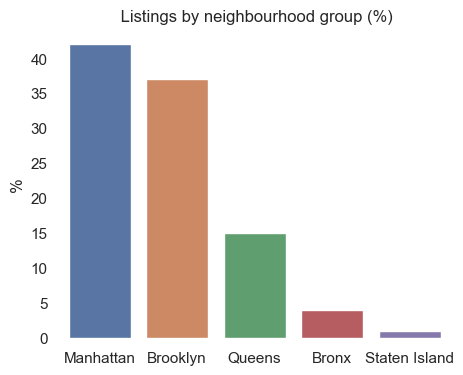

In [14]:
sns.set(rc={'figure.figsize':(5,4)})
sns.set(style = "white")
#Calculating number of listings for each neighbourhood group

nbd_group = ny_listings_df["neighbourhood_group_cleansed"].value_counts().sort_values(ascending = False)

#Calculating the percentage of listings for each group

nbd_group_pct = round(ny_listings_df["neighbourhood_group_cleansed"]. value_counts(normalize = True) *100, 0)

print(nbd_group_pct)

#Plotting the percentage of listings for each group

bar_plot_1 = sns.barplot(x = nbd_group_pct.index, y = nbd_group_pct)

bar_plot_1.set_title(" Listings by neighbourhood group (%)")
bar_plot_1.tick_params(bottom=False, top=False, left=False, right=False);
bar_plot_1.set_ylabel('%', fontsize=12)
for kew, spine in bar_plot_1.spines.items():
    spine.set_visible(False)

### Answer:
Manhattan and Brooklyn cover almost 80% of the listings in the dataset.  
It looks like it is likely that I will find my accommodation in these neighbourhood groups as almost 4/5 ths of the Airbnb listings are located in them.

##  Q2. How do prices of listings vary by neighbourhood?

To help answer this question, we will need to look at the price and neighbourhood related variables.  

I decide to look at the neighbourhood group feature in the dataset which tell us which neighbourhood group the listing is located and the price feature which tells us the price of the listing.

In [15]:
ny_listings_df[["price","neighbourhood_cleansed"]].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39881 entries, 0 to 39880
Data columns (total 2 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   price                   39881 non-null  object
 1   neighbourhood_cleansed  39881 non-null  object
dtypes: object(2)
memory usage: 623.3+ KB


I notice that price is stored as an object which is wierd as it should ideally be a numerical value.  
To do further analysis, I will convert this to a numerical data type.

In [16]:
ny_listings_df["price"]= ny_listings_df["price"].str.replace('[$,]', '', regex=True).astype(float)

In [17]:
ny_listings_df["price"].describe()

count    39881.000000
mean       197.547235
std        353.332544
min          0.000000
25%         80.000000
50%        130.000000
75%        219.000000
max      16500.000000
Name: price, dtype: float64

Firstly, it is confirmed that now my prive column is stored as a numerical data type.

**Takeaways:**

1. The price column has a minimum value of 0 which doesn't make sense as hosts wouldn't want to put out their homes to strangers for free. We should investigate this.
2. I see that the average price per night is around 200 dollars with a median price of 130 dollars.I should be ready to shell out a lot for a 7 days trip just on accommodation.
3. Since the mean and median values are not the same - it means there is some skewness in the data.I will plot it to see the distribution visually

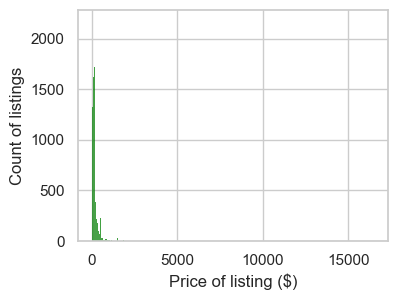

In [18]:
#Plotting the histogram of prices to see the distribution of the prices of listings in the dataset
sns.set(rc={'figure.figsize':(4,3)})
sns.set(style = "whitegrid")
ax = sns.histplot( data = ny_listings_df, x = "price", color = "green")

ax.set(xlabel='Price of listing ($)', ylabel='Count of listings')

plt.show()

**Takeaways:**

There is a wide range of price values, with a signficant number of positive outliers in the price distributio.  
It looks likes there are a few listings with high prices which is skewing the distribution

### Dealing with outliers in the pricing data

In [19]:
# Removing outliers

q3 = ny_listings_df["price"].quantile(0.75)  
q1 = ny_listings_df["price"].quantile(0.25)

IQR = q3- q1

lower_limit = q1 - (IQR * 1.5) #calculated by multiplying the IQR value by 1.5 and then subtracting the resulting value from q1
upper_limit = q3 + (IQR * 1.5)

price_outliers = np.where(ny_listings_df["price"] > upper_limit, True,
                np.where(ny_listings_df["price"] < lower_limit, True, False))
    
price_without_outliers = ny_listings_df.loc[~(price_outliers)]

print(ny_listings_df.shape)
print(price_without_outliers.shape)


(39881, 21)
(37085, 21)


The output shows that 1796 listings were classified as outliers and removed from the dataset. In any case, I couldn't have been able to afford them anyway!

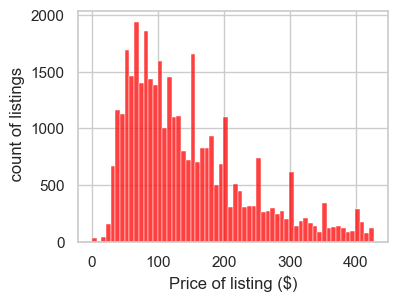

In [20]:
# Plotting the prices of listings without the outliers

p = sns.histplot( data = price_without_outliers, x = "price", color = "red")

p.set (xlabel = "Price of listing ($)", ylabel = " count of listings")

plt.show()


Now that we have dealt with the outliers, we see that we still have listings with prices listed as 0. This is an issue as logically, we wouldn't expect any listing to be offered for free to strangers on Airbnb. So I look at this in more detail.

In [21]:
price_without_outliers[price_without_outliers["price"] ==0]

,id,has_availability,number_of_reviews,property_type,room_type,accommodates,neighbourhood_group_cleansed,neighbourhood_cleansed,latitude,longitude,...,host_is_superhost,host_identity_verified,review_scores_value,review_scores_location,review_scores_checkin,review_scores_cleanliness,review_scores_accuracy,bathrooms_text,beds,bedrooms
20784,40560656,t,0,Room in boutique hotel,Hotel room,2,Brooklyn,Williamsburg,40.720960,-73.958600,...,NaN,t,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
21467,41740615,t,44,Room in boutique hotel,Hotel room,4,Manhattan,Midtown,40.744590,-73.985740,...,NaN,t,4.32,4.66,4.39,4.64,4.45,NaN,NaN,NaN
21469,41740622,t,4,Room in hotel,Hotel room,6,Manhattan,Upper East Side,40.764420,-73.963030,...,NaN,t,4.00,4.50,4.50,4.50,3.75,NaN,NaN,NaN
21581,42065543,t,0,Room in boutique hotel,Hotel room,4,Manhattan,Midtown,40.744440,-73.989200,...,NaN,t,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
21589,42065545,t,0,Room in boutique hotel,Hotel room,4,Manhattan,Midtown,40.759170,-73.969260,...,NaN,t,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
21590,42065547,t,36,Room in hotel,Hotel room,4,Manhattan,Hell's Kitchen,40.764040,-73.994780,...,NaN,t,4.36,4.75,4.61,4.19,4.44,NaN,NaN,NaN
21592,42065555,f,1,Room in hotel,Hotel room,2,Brooklyn,Williamsburg,40.715230,-73.959080,...,NaN,t,5.00,5.00,5.00,5.00,5.00,NaN,NaN,NaN
21593,42065562,t,0,Room in hotel,Hotel room,4,Manhattan,Financial District,40.709580,-74.008740,...,NaN,t,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
21602,42065563,t,0,Room in hotel,Hotel room,4,Bronx,Mott Haven,40.815130,-73.916020,...,NaN,t,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
21603,42065564,t,39,Room in hotel,Hotel room,5,Manhattan,Financial District,40.704620,-74.010270,...,f,t,4.69,4.79,4.82,4.72,4.74,NaN,NaN,NaN


There are only 30 listings with 0 as price. So I am fine to drop them.

Another potential approach would be to impute the price from other similar listings. To get an accurate data for each listing, we would want to know which features impact the price of the listing and then use them to predict the price of the listings with 0 prices to fill up that data in our dataset. But for the purposes of my current analysis, I don't want to go that route as I don't lose too many listings by dropping them.

In [22]:
price_without_outliers = price_without_outliers[price_without_outliers.price != 0]

Finally, to answer my question, I plot an ECDF graph to look at how the pricing distribution of listings looks like by neighbourhood groups.
I plot an ECDF graph because unlike a histogram or KDE, an ECDF plots each listing on the graph so I don't lose information and it gives me broad information like central tendencies to understand the distribution.

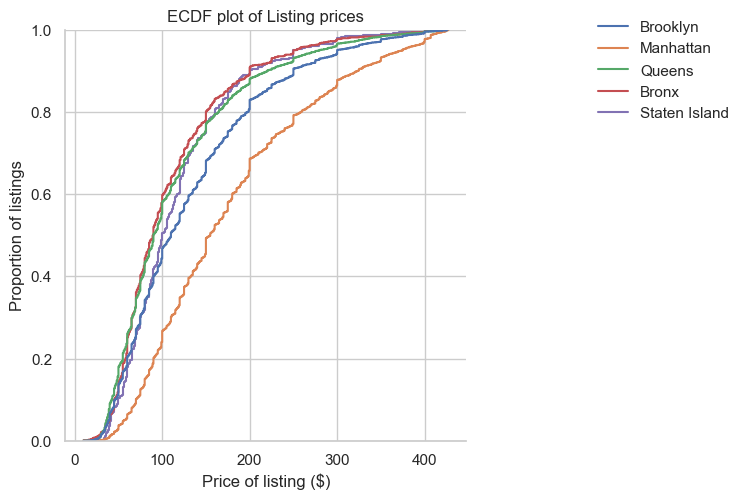

In [23]:
#An ECDF represents the proportion or count of observations falling below each unique value in a dataset

ecdf_plot = sns.displot(price_without_outliers, x = "price", hue = "neighbourhood_group_cleansed", kind = "ecdf")

ecdf_plot.set(xlabel ="Price of listing ($)", 
               ylabel = "Proportion of listings", 
               title = "ECDF plot of Listing prices")

sns.move_legend(
    ecdf_plot, "upper right",
    bbox_to_anchor=(1, 1), title=None, frameon=False,
)

plt.show()

### Answer:
1. The range of prices for listings in all neighbourhood groups range from over 0 to 420.
2. prices of listings **does** vary by neighbourhood group.Manhattan is the most expensive neighbourhood group, followed by Brooklyn.
3. Around 65% of listings are priced at 200 dollars in Manhattan vs 80% in Brooklyn

## Is living near tourist attractions going to cost me lot?

As a young kid, I had seen pictures of the Statue of Liberty in my Encyclopedia ( yes, I am from the generation before the internet came into our houses!). Ever since then I have been facinated by the monument and New York city. Did you know that the Statue of Liberty wasn't always green? When France gifted Lady Liberty to the U.S., she was a 305-foot statue with reddish-brown copper skin. Her color change is thanks to about all the subsequent years' worth of chemistry in the air of New York City harbor. 

Then there is the famous Rockefeller center christmas tree made famous for me by the Home Alone movie. 

These and a few other tourist sites have always been in my list of things to do when I visit New York. So I decide to look at how feasible it would be to live near my list of tourist sites. I do this by visually representing my tourist sites locations on a map and looking at a heatmap of the listings based on their prices.

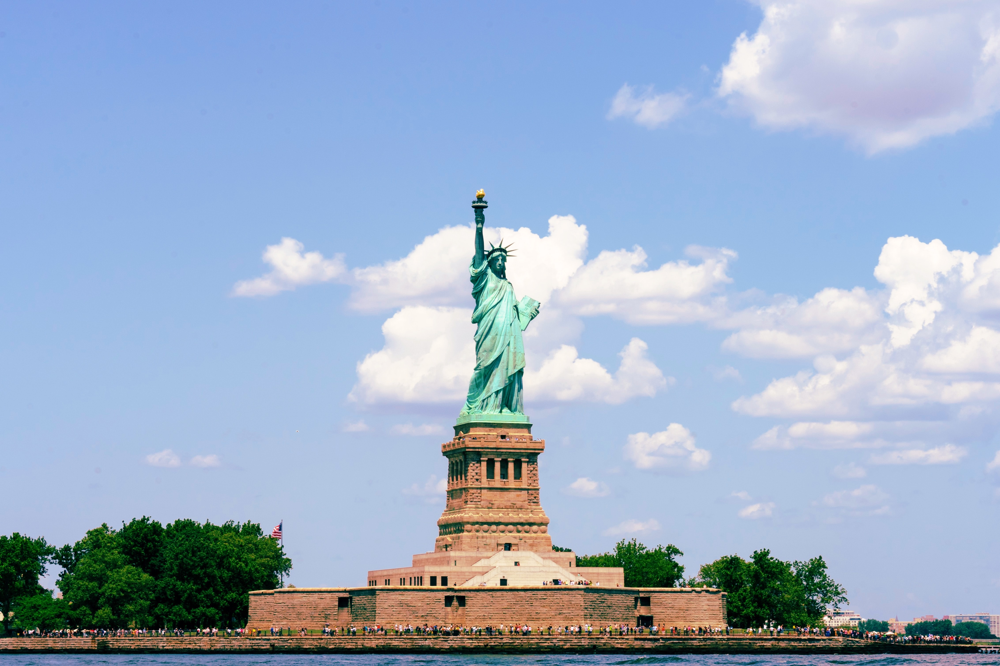

In [24]:
#Create a subset of listings data with the grographical coordinates and price
df = price_without_outliers[["latitude", "longitude", "price"]]

In [25]:
lat = listings_data.at[0, 'latitude']
long = listings_data.at[0,'longitude']

map = folium.Map(location=[lat, long], tiles="OpenStreetMap")

In [26]:
#Create a heatmap of listings by their prices
from folium.plugins import HeatMap

HeatMap(df,
        min_opacity=0.05,
        max_opacity=0.9,
        gradient={0.1: 'blue', 0.3: 'lime', 0.5: 'yellow', 0.7: 'orange', 1: 'red'},
        blur = 15).add_to(folium.FeatureGroup(name='Heat Map').add_to(map))


In [27]:
#Locate the tourist attractions that I am keen to visit during my trip
df2 = gpd.read_file('Points Of Interest.geojson')

locations = ["STATUE OF LIBERTY", 
             "CENTRAL PARK", 
             "ROCKEFELLER CENTER", 
             "METROPOLITAN MUSEUM OF ART", 
             "EMPIRE STATE BUILDING",
            "AMERICAN MUSEUM OF NATURAL HISTORY",
            "GRAND CENTRAL TERMINAL",
             "CARNEGIE HALL",
             "WASHINGTON SQUARE PARK",
             "BROADWAY"
            ]

tourist_sites =df2[df2['name'].isin(locations)]
print(tourist_sites.shape)
tourist_sites.reset_index(drop = True, inplace = True)# to reset index to start from 0 again

tourist_sites["latitude"] = [point.xy[1][0] for point in tourist_sites.geometry]
tourist_sites["longitude"] = [point.xy[0][0] for point in tourist_sites.geometry]

(11, 16)


In [28]:
#Create a geomtery list from the geodataframe
geo_list = [[point.xy[1][0], point.xy[0][0]] for point in tourist_sites.geometry]

#Iterate through list and add a marker for each tourist site
i = 0

for coordinates in geo_list:
    # Place the markers with the popup labels
    folium.Marker(
        location=coordinates,
        popup= "Name: " + str(tourist_sites.name[i]) + "<br>"
                + "Coordinates: " + str(geo_list[i]),
        icon=folium.Icon(color="red", icon = 'info-sign'),
    ).add_to(map)
    i = i + 1
    
map

### Answer:

It looks ike all the tourist sites are mainly located in the areas where listings are priced higher than others. This makes sense as like me, most other tourists would also want to live closer to main tourist sites which will drive the demand up in those locations. Also the fact that the toruist sites are around Manhattan neighbourhood implies that real estate in general will be expensive in that area.

I guess I will be better off finding an accommodation further away and saving those extra bucks to spend on some good food during the trip!

## Q4: Should I choose to go with a listing where the host is a superhost?

When going through Airbnb listings, there is a category of listings which point out that the host is a 'superhost'. I have been intrigued by how different listings by superhosts are compared to other hosts.

So I look into the ratings information available in the data. These features provide ratings information about the listing on varioas aspects such as value for money, location, cleanliness etc. I am particularly interested in looking at prices, ratings for value for money and location and how these are associated with a host being a superhost.

In [29]:
#Create a subset of the listings data with the features of interest
df3 = price_without_outliers[["price", 
                                  "host_is_superhost", 
                                  "number_of_reviews",
                                 "review_scores_value", 
                                 "review_scores_location",
                                 "review_scores_checkin",
                                 "review_scores_cleanliness",
                                 "review_scores_accuracy",]]

In [30]:
df3[["review_scores_value", "review_scores_location"]].describe()

,review_scores_value,review_scores_location
count,29307.000000,29307.000000
mean,4.653573,4.737259
std,0.487561,0.409576
min,0.000000,0.000000
25%,4.560000,4.650000
50%,4.780000,4.860000
75%,4.970000,5.000000
max,5.000000,5.000000


I see that not all listings have reviews data available but the sample of listings with ratings data is sufficient for me to get an intial answer to my questions. Any NaN values are automatically excluded when using the 'corr' function.

<AxesSubplot: >

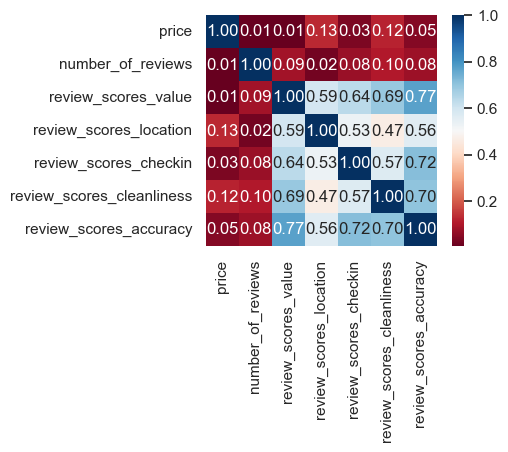

In [31]:
#Calculate a correlation matrix heatmap.This allows us to see how the features coorelate with each other.
corr = df3.corr()

sns.heatmap(corr, cmap='RdBu', fmt='.2f', square=True, linecolor='white', annot=True)


**Takeways:**

1. The matrix shows the degree of correlation of each of the numerical variables with the other numerical variables. The darker the blue the higher the degree of correlation between the variables. The darker the red, the lower the degree of correlation between the variables.

2. It is surprising that the price of a listing is not strongly correlated with the number of reviews or with any of the review scores.

3. It is interesting to note that the different review scores are strongly correlated with each other. So a listing with a higher rating one aspect is likely to have a higher rating on other aspects.



I then look at how the host being a superhost is associated with prices and ratings for location and value for many.

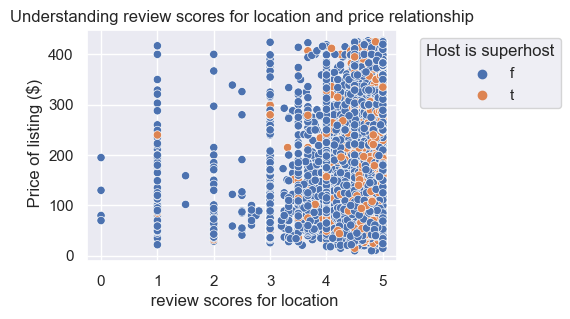

In [32]:
#Look at the relation between review scores for location rating and price by host type 

sns.set_style(style = "whitegrid")
sns.set(rc={'figure.figsize':(4,3)})

l = sns.scatterplot( data = df3,
               x = "review_scores_location",
               y = "price",
               hue = "host_is_superhost",
            )
plt.title("Understanding review scores for location and price relationship")
plt.xlabel(" review scores for location")
plt.ylabel(" Price of listing ($)")


plt.legend(title = "Host is superhost",
           bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

**Takeaways:**

The scatter plot shows that there is no association between the the host being a superhost with the price.
However superhosts do tend to have a higher review score for location.

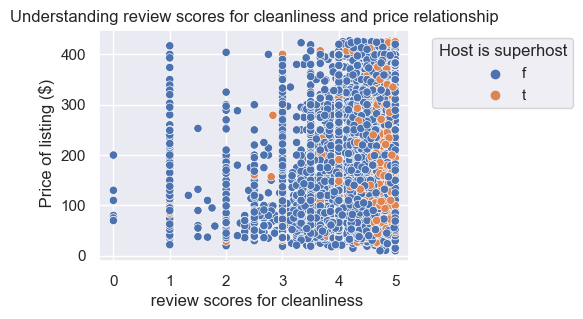

In [33]:
#Look at the relation between review scores for cleanliness rating and price by host type 

sns.set_style(style = "whitegrid")
sns.set(rc={'figure.figsize':(4,3)})

c = sns.scatterplot( data = df3,
               x = "review_scores_cleanliness",
               y = "price",
               hue = "host_is_superhost",
            )
plt.title("Understanding review scores for cleanliness and price relationship")
plt.xlabel(" review scores for cleanliness")
plt.ylabel(" Price of listing ($)")


plt.legend(title = "Host is superhost",
           bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

We see a similar story for ratings on cleanliness and prices by host type.

### Answer:

So to answer my question, a host being a super host doesn't imply that they charge higher prices on their listings than others. However, superhosts do tend to have higher ratings across different aspects of the listing - such as cleanliness which I am particular about. 

## Q: Does it matter what time of the year, month or week I decide to visit NYC when it comes to accommodation prices?

Autumn is my favourite time time of the year. So ideally I would love to visit NYC during that time of the year. Look at how beautiful it gets!

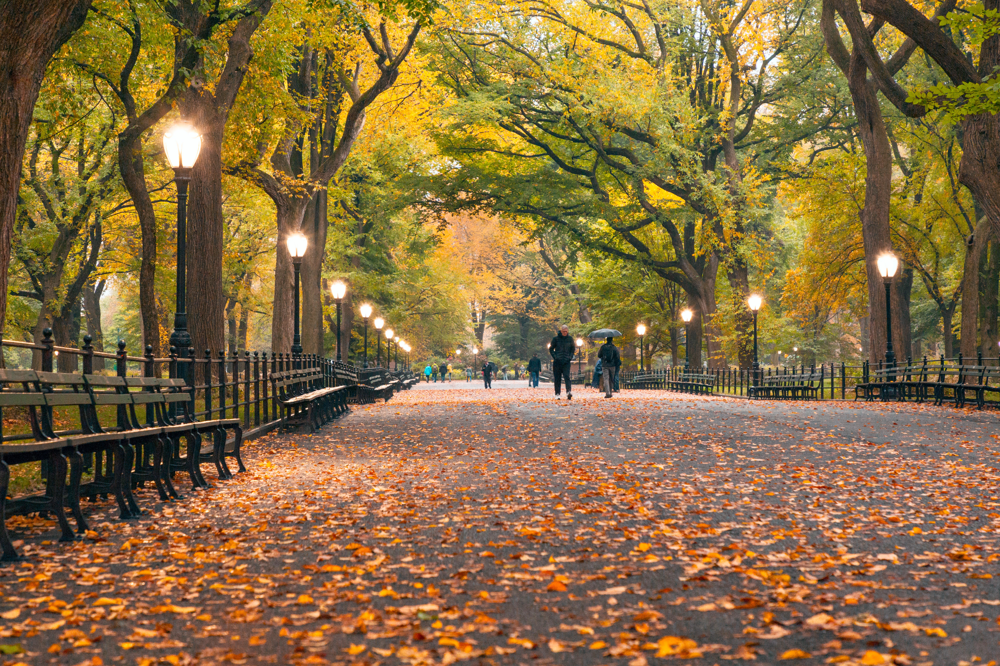

**But** I wanted to see if that would be the best time of the year to visit NYC cost-wise. So I decided to look at how prices of listsings varied across the year. And while I was at it, might also look at if there is any variation in prices in a given month and during the week. Why leave money on the plate if I can save some extra just by planning the trip at the right point in the year, right?

For this part of the analysis, I use a separate dataset which provides data on the dates for the listings. The calendar file records the price, availability and other details from the listing's calendar for each day of the next 365 days.

I will plot some graphs to see how average prices of listings look like across the year, month and week. 

In [34]:
calendar_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 616120 entries, 0 to 616119
Data columns (total 7 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   listing_id      616120 non-null  int64 
 1   date            616120 non-null  object
 2   available       616120 non-null  object
 3   price           616120 non-null  object
 4   adjusted_price  616120 non-null  object
 5   minimum_nights  616120 non-null  int64 
 6   maximum_nights  616120 non-null  int64 
dtypes: int64(3), object(4)
memory usage: 32.9+ MB


The first thing that sticks out is that the date and price variable is an onject data type. So I start off by converting the date column into a datetime data type and price to numerical data type.

In [35]:
calendar_data["date"] = pd.to_datetime(
    calendar_data["date"],  
    format="%Y-%m-%d" 
)

calendar_data["price"]= calendar_data["price"].str.replace('[$,]', '', regex=True).astype(float)
calendar_data.dtypes

listing_id                 int64
date              datetime64[ns]
available                 object
price                    float64
adjusted_price            object
minimum_nights             int64
maximum_nights             int64
dtype: object

In [36]:
date_range = str(calendar_data["date"].dt.date.min()) + ' to ' +str(calendar_data["date"].dt.date.max())
date_range

'2022-09-28 to 2023-09-27'

It looks like the dataset contains information from September 2022 to Seotember 2023.

In [37]:
#Extracting information from the date to get new information into seperate columns

calendar_data["month"] = calendar_data["date"].dt.month #get the month
calendar_data["day"] = calendar_data["date"].dt.day #get the day
calendar_data["year"] = calendar_data["date"].dt.year #get the year

calendar_data["weekday"] = calendar_data["date"].dt.day_name() #get the weekday name from the day

In [38]:
#Sort out the weekdays to have them in order which helps with the plotting
sorter = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']
sorterIndex = dict(zip(sorter,range(len(sorter))))
sorterIndex

{'Sunday': 0,
 'Monday': 1,
 'Tuesday': 2,
 'Wednesday': 3,
 'Thursday': 4,
 'Friday': 5,
 'Saturday': 6}

I then create the datasets I need to plot the graphs. For the graphs I will need the average price of the listings for each:

* month of the year to see how prices vary across months in a year
* day of the month to see how prices vary across a month
* day of the week to see how prices vary across a week

In [39]:
#Calculating average prices
avg_price_month= pd.DataFrame(calendar_data.groupby("month")["price"].mean()).reset_index()
avg_price_day= pd.DataFrame(calendar_data.groupby("day")["price"].mean()).reset_index()
avg_price_weekday= pd.DataFrame(calendar_data.groupby("weekday")["price"].mean())

### How do average prices vary across the year?

[Text(0.5, 0, 'Month of the year'),
 Text(0, 0.5, ' Average price of listings ($)')]

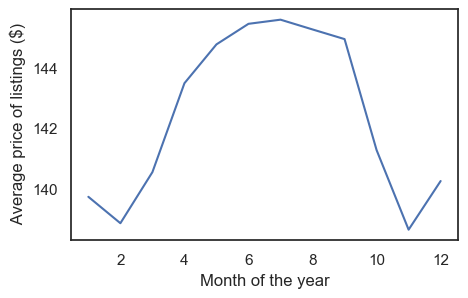

In [40]:
#Creating a line chart
plt.figure(figsize=(5,3))

sns.set_style("white")
m = sns.lineplot(x = "month", y = "price", data= avg_price_month )

m.set (xlabel = "Month of the year", ylabel = " Average price of listings ($)")

**Takeaway:**  
It looks like the prices of listings are highest in the summer months and start to fall off until suddenly rising again around Christmas time. So it is likely that summer months are the most popular for tourists to visit alongside Christmas.

[Text(0.5, 0, 'Day of the month'),
 Text(0, 0.5, ' Average price of listings ($)')]

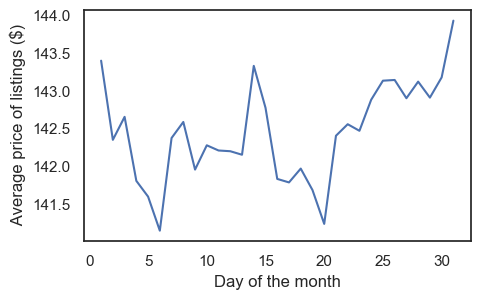

In [41]:
#Creating a line chart
plt.figure(figsize=(5,3))

sns.set_style("white")
d = sns.lineplot(x = "day", y = "price", data= avg_price_day )

d.set (xlabel = "Day of the month", ylabel = " Average price of listings ($)")

**Takeaway:**  
While looking within a month, the picture if not so clear. There seems to a rise in prices of listings towards the middle and end of the month.


In [42]:
#Order days of the week

avg_price_weekday['Day_id'] = avg_price_weekday.index
avg_price_weekday['Day_id'] = avg_price_weekday['Day_id'].map(sorterIndex)
avg_price_weekday.sort_values("Day_id", inplace =True)
avg_price_weekday

,price,Day_id
weekday,,
Sunday,141.350084,0
Monday,140.298271,1
Tuesday,140.155828,2
Wednesday,140.199577,3
Thursday,140.728981,4
Friday,146.995340,5
Saturday,147.246742,6


[Text(0.5, 0, 'Day of the week'),
 Text(0, 0.5, ' Average price of listings ($)')]

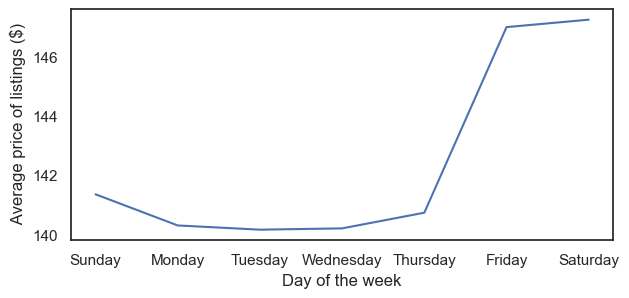

In [43]:
#Creating a line chart
plt.figure(figsize=(7,3))

sns.set_style("white", rc={'figure.figsize':(5,3)})
w = sns.lineplot(x = "weekday", y = "price", data= avg_price_weekday )

w.set (xlabel = "Day of the week", ylabel = " Average price of listings ($)")

### Answer:

So it looks like travelling during autumn isn't such a bad idea. Given that I can work remotely, I can also try and book my trip to cover more weekdays than weekends which might save me some money.